In [1]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
import statsmodels.api as sm

sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('poster')
from sklearn.model_selection import train_test_split

In [2]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


In [3]:
sns.set_context('poster')
sns.set_style('white')

In [71]:

ppallete = 'RdYlGn'#'YlGn_d' #"BuGn_d"
porder = ['MED4',  'MIT9312','MIT0604', 'Natl2A', 'MIT9313']
ppallete = [ '#62A586', '#face6e','#f79934', '#7A9BC8', '#F47681', ]
psizes = [150,120,200,120,350]
pmarkers = ['o', 's', '^', 'D', '*']

# #ffd7a1
    
pedge = 'green'
apallete = "spring"
aorder = ['DE', 'DE1', '1A3', 'ATCC', 'BS11']
amarkers = ['P', 'X', 'h', '<','>']
apallete = ['#6dad36', '#c7e89f', '#f5c4e1', '#d5579d', '#8a0850']

aedge='orange'
epallete = ['#6cf0ba', '#d13f75', '#eeb7cb', '#b9d2d8', '#407f90']
#sns.diverging_palette(355, 217, s=74, l=50, n=4) #'Paired' # 'BrBG'# "coolwarm"
eorder = ['e1','e3', 'e4', 'e5', 'e6']
#aedge='orange'


In [5]:
df = pd.read_pickle('CCPA.pkl.gz')
df.loc[df.PRO == 'C9B', 'PRO'] = 'MIT0604'

In [6]:
dfw = df.loc[(df.experiment.isin(['e1', 'e3', 'e4','e5', 'e6']))]

In [7]:
#dfw = df.loc[(df.experiment.isin(['e1','e3', 'e4','e5', 'e6'])) # & (df.culture == 'Co_Culture')
#            ]

In [8]:
dfdecline = cp.generate_decline(dfw, scale=False)
#dfdecline = dfdecline.loc[dfdecline['day'] <= 80]

In [9]:
dfdecline.head()

,experiment_sample,day,FL,experiment,sample,PRO,ALT,culture
0,"e1, 10A",0.000000,5.621,e1,10A,MIT0604,DE,Co_Culture
1,"e1, 10A",0.893056,4.045,e1,10A,MIT0604,DE,Co_Culture
2,"e1, 10A",1.991667,2.749,e1,10A,MIT0604,DE,Co_Culture
3,"e1, 10A",4.697222,2.924,e1,10A,MIT0604,DE,Co_Culture
4,"e1, 10A",5.700000,2.519,e1,10A,MIT0604,DE,Co_Culture


In [10]:
def _load_fcm_fl_csv(data_dpath, fname):
    df = pd.read_csv(os.path.join(data_dpath, fname), index_col=0, header=None).T
    #df = df.reset_index()
    # remove rows and columns that are all nan
    df = df.dropna(how='all')
    df = df.loc[:, df.columns.notnull()] 
    df['Sample'] = os.path.splitext(fname)[0]
    df.VALUE = pd.to_numeric(df.VALUE)
    df.day = pd.to_numeric(df.day)
    df['MODE'] = df.EXP.str.split('_', expand=True)[1]
    return df

In [11]:
data_dpath = r'fcm_and_fl'
csv_fnames = [ n for n in os.listdir(data_dpath) if n.endswith('.csv')]
temp_dfs = [_load_fcm_fl_csv(data_dpath, fname) for fname in csv_fnames]
prevfcm_df = pd.concat(temp_dfs)
prevfcm_df.loc[prevfcm_df['MODE']== 'PRO99','MODE'] = 'pro99'
prevfcm_df.loc[prevfcm_df.Sample == '9313 LD_FL1', 'PRO'] = 'MIT9313'
prevfcm_df = prevfcm_df.fillna({'ALT': 'N/A'}, )

In [12]:
def get_fl_day(df, row):
    x = row['day']
    e = row['EXP']
    
    possible_days = df.loc[(df.METHOD == 'FL') & (df.EXP == e) & (df.day >= x) & (df.day < x+1), 'day' ].unique()
    if len(possible_days) == 0:
        possible_days = df.loc[(df.METHOD == 'FL') & (df.EXP == e) & (df.day >x-1) & (df.day < x+1), 'day' ].unique()
    if len(possible_days) == 0:
        flday =  None
        flval = None
    else: 
        flday =  possible_days[0]
        flval = df.loc[(df.METHOD == 'FL') & (df.EXP == e) & (df.day == flday), 'VALUE' ].unique()[0]
    return pd.Series({'fl_day': flday, 'FL': flval})
        
    

d = prevfcm_df.apply(lambda x: get_fl_day(prevfcm_df,x), axis=1)
prevfcm_df = pd.concat([prevfcm_df, d], axis=1)
compdf = prevfcm_df.loc[prevfcm_df.METHOD == 'FCM']
compdf.rename(columns={'VALUE': 'FCM'}, inplace=True)
compdf.dropna(axis='rows', inplace=True)

C:\Users\wosnat\Anaconda3\lib\site-packages\pandas\core\frame.py:4218: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(**kwargs)
C:\Users\wosnat\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [13]:
X = compdf['FL']
y = compdf['FCM']
res = sm.OLS(y, X).fit()
print(res.summary())

                                 OLS Regression Results                                
Dep. Variable:                    FCM   R-squared (uncentered):                   0.849
Model:                            OLS   Adj. R-squared (uncentered):              0.849
Method:                 Least Squares   F-statistic:                              1935.
Date:                Tue, 17 Mar 2020   Prob (F-statistic):                   4.53e-143
Time:                        12:55:09   Log-Likelihood:                         -6491.9
No. Observations:                 344   AIC:                                  1.299e+04
Df Residuals:                     343   BIC:                                  1.299e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [14]:
dt = res.get_prediction(dfdecline['FL']).summary_frame(alpha = 0.05)
y_pred = dt['mean']
dfdecline['FL_o'] = dfdecline['FL'] 
dfdecline['FL'] = y_pred

In [15]:
for n, f in [
    ('exponential', cp.model_exponential1),
    #('hyperbolic', cp.model_hyperbolic),
    ('harmonic', cp.model_harmonic),
]:
    #f = cp.model_exponential
    t = dfdecline.groupby('experiment_sample').apply(lambda x: cp.apply_fit1(x, f, print_popt=False))
    dfdecline[n] = t['y_pred']
    for i in range(3):
        dfdecline[f'{n}_popt_{i}'] = t[f'popt_{i}']
#dfdecline['decline'] = dfdecline.FL
#dfdecline['exponential_diff'] = dfdecline.FL - dfdecline.exponential
#dfdecline['decline_scaled'] = dfdecline.groupby('experiment_sample').FL.transform(lambda x: x / x.max())
#df_exp_coef = dfdecline.groupby(['experiment_sample','popt_0', 'popt_1', 'popt_2'])['decline'].count().reset_index(level=[1,2,3])\
#.drop(columns='decline')

In [16]:
dfdecline.columns

Index(['experiment_sample', 'day', 'FL', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'FL_o', 'exponential', 'exponential_popt_0',
       'exponential_popt_1', 'exponential_popt_2', 'harmonic',
       'harmonic_popt_0', 'harmonic_popt_1', 'harmonic_popt_2'],
      dtype='object')

In [17]:
dfdecline.head()

,experiment_sample,day,FL,experiment,sample,PRO,ALT,culture,FL_o,exponential,exponential_popt_0,exponential_popt_1,exponential_popt_2,harmonic,harmonic_popt_0,harmonic_popt_1,harmonic_popt_2
0,"e1, 10A",0.000000,1.947185e+08,e1,10A,MIT0604,DE,Co_Culture,5.621,1.947185e+08,0.139137,1.0,1.0,1.947185e+08,0.27727,1.0,1.0
1,"e1, 10A",0.893056,1.401239e+08,e1,10A,MIT0604,DE,Co_Culture,4.045,1.719662e+08,0.139137,1.0,1.0,1.560722e+08,0.27727,1.0,1.0
2,"e1, 10A",1.991667,9.522880e+07,e1,10A,MIT0604,DE,Co_Culture,2.749,1.475903e+08,0.139137,1.0,1.0,1.254443e+08,0.27727,1.0,1.0
3,"e1, 10A",4.697222,1.012910e+08,e1,10A,MIT0604,DE,Co_Culture,2.924,1.012910e+08,0.139137,1.0,1.0,8.457194e+07,0.27727,1.0,1.0
4,"e1, 10A",5.700000,8.726131e+07,e1,10A,MIT0604,DE,Co_Culture,2.519,8.810015e+07,0.139137,1.0,1.0,7.545938e+07,0.27727,1.0,1.0


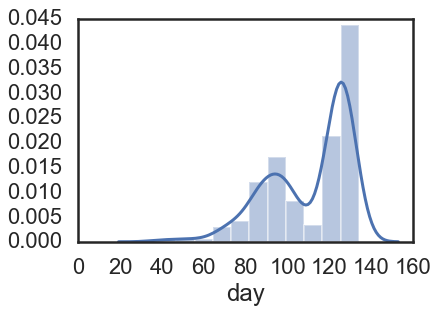

In [18]:
sns.distplot(dfdecline.groupby('experiment_sample')['day'].max()) #.sort_values()

In [19]:
def _compute_score_model(x,m):
    res = {f'{m}_popt_{i}' : x[f'{m}_popt_{i}'].unique()[0] for i in range(3)}
    if np.isnan(res[f'{m}_popt_0']):
        res.update({
            f'rmse_{m}' : np.NaN,
            f'rmse_{m}_60' : np.NaN,
            f'rmse_{m}_5' : np.NaN,
            f'bic_{m}' : np.NaN,
        })
    else:
        x60 = x.loc[x.day >= 60]
        x5 = x.loc[x.day <= 5]
        n = x.shape[0]
        num_params = 3 if m == 'hyperbolic' else 2
        res.update({
            f'rmse_{m}' : np.sqrt(metrics.mean_squared_error(x['FL'], x[m])),
            f'rmse_{m}_60' : np.sqrt(metrics.mean_squared_error(x60['FL'], x60[m])) if x60.shape[0]>2 else np.NaN,
            f'rmse_{m}_5' : np.sqrt(metrics.mean_squared_error(x5['FL'], x5[m])),
            f'bic_{m}' : n * np.log(metrics.mean_squared_error(x['FL'], x[m])) + num_params * np.log(n),
        })
    return res

def _compute_r2(x):
    models = ['exponential', #'hyperbolic',
              'harmonic', ]
    res_list = [_compute_score_model(x,m) for m in models]
    res =dict()
    for i in res_list:
        res.update(i)
    return pd.Series(res)
groupcols = ['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT', 'culture', ]
dfscore = dfdecline.groupby(groupcols).apply(_compute_r2).reset_index()

In [20]:
dfscorem = dfscore.melt(id_vars=['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT', 'culture'],
                        value_vars=['rmse_exponential', #'rmse_hyperbolic', 
                                    'rmse_harmonic', 
                                    'rmse_exponential_60', #'rmse_hyperbolic_60', 
                                    'rmse_harmonic_60',
                                    'rmse_exponential_5', #'rmse_hyperbolic_5',
                                    'rmse_harmonic_5',
                                    'bic_exponential', #'bic_hyperbolic', 
                                    'bic_harmonic'
                                    
                                   ], 
                        value_name='RMSE',
                        var_name='model')


In [21]:
dfscorem['s'] = dfscorem['sample'] +', '+ dfscorem.ALT
dfscorem['e'] = dfscorem['experiment'] +', '+ dfscorem.culture
dfscorem['p'] = dfscorem['PRO'] 
dfscorem.loc[dfscorem.culture == 'Axenic', 'p'] =dfscorem.loc[dfscorem.culture == 'Axenic', 'p']+ ' Axenic'



Text(0.5,1,'root mean square error per model')

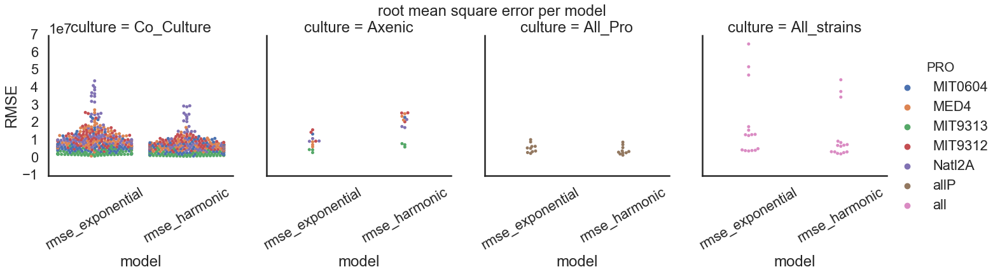

In [22]:
cols=['rmse_exponential',# 'rmse_hyperbolic', 
      'rmse_harmonic', 
      #'rmse_exponential_60', 'rmse_hyperbolic_60', 'rmse_harmonic_60',
      #'mse_exponential_5', 'mse_hyperbolic_5', 'mse_harmonic_5'
] 

g = sns.catplot(data=dfscorem.loc[dfscorem.model.isin(cols)], x='model', y='RMSE', hue='PRO', kind='swarm', #aspect=2,
           #palette='cubehelix'
            col='culture',
           )
g.set_xticklabels(rotation=30)
#plt.xticks(rotation=45)
plt.suptitle('root mean square error per model', y=1)

C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Text(0.5,1,'RMSE co-culture')

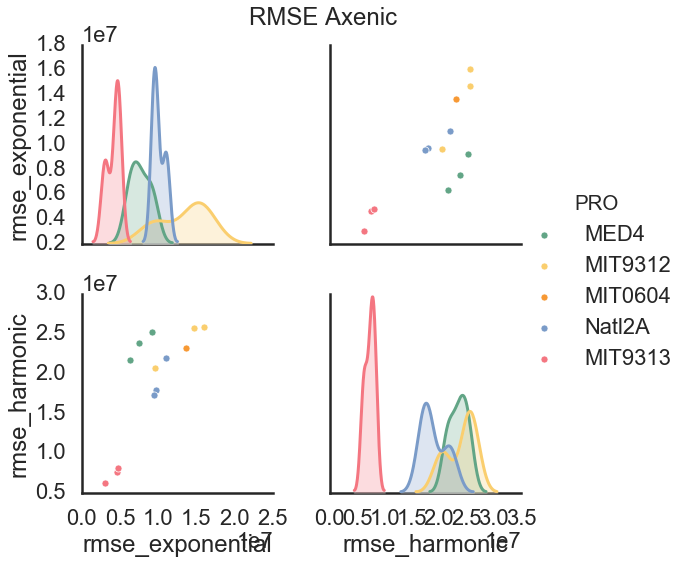

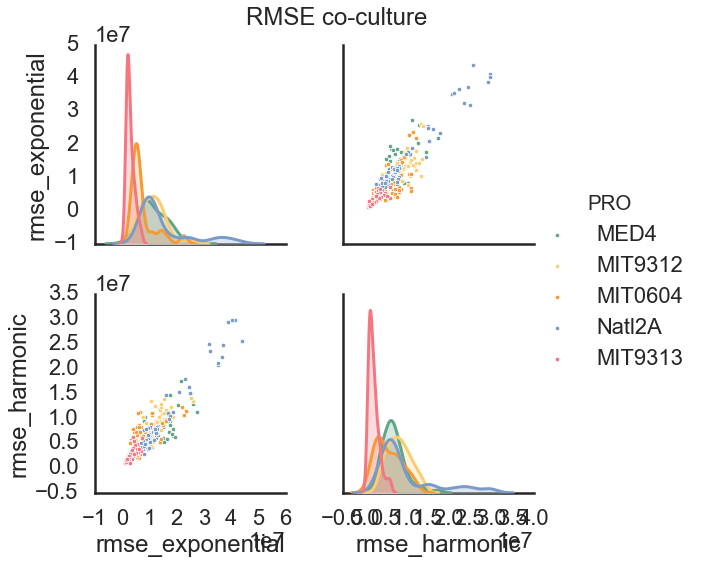

In [23]:
sns.pairplot(dfscore.loc[dfscore.culture == 'Axenic'], 
             vars=['rmse_exponential', #'rmse_hyperbolic', 
                   'rmse_harmonic',
                            #'rmse_exponential_60', 'rmse_hyperbolic_60', 'rmse_harmonic_60'
                            #'rmse_exponential_5', 'rmse_hyperbolic_5', 'rmse_harmonic_5',
                           ],
             height=4, 
             hue='PRO', hue_order=porder, palette=ppallete,
             plot_kws={"s": 50},
             #kind='reg'
            )
plt.suptitle('RMSE Axenic', y=1)
sns.pairplot(dfscore.loc[dfscore.culture == 'Co_Culture'], 
             vars=['rmse_exponential', #'rmse_hyperbolic',
                   'rmse_harmonic',
                            #'rmse_exponential_60', 'rmse_hyperbolic_60', 'rmse_harmonic_60'
                            #'rmse_exponential_5', 'rmse_hyperbolic_5', 'rmse_harmonic_5',
                           ],
             height=4, 
             plot_kws={"s": 20},
             hue='PRO', hue_order=porder, palette=ppallete,
             #kind='reg'
            )
plt.suptitle('RMSE co-culture', y=1)


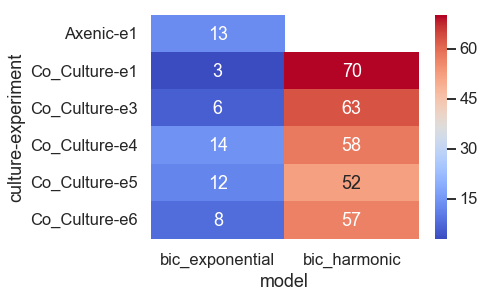

In [24]:
best_model_df = dfscorem.loc[dfscorem.model.isin(['bic_exponential', 'bic_harmonic'])
                            ].sort_values('RMSE', ascending=True).drop_duplicates([
    'experiment_sample', ])
t = best_model_df.loc[best_model_df.culture.isin(['Axenic', 'Co_Culture'])].pivot_table(index=['culture',  'experiment'],columns=['model'], values='sample', aggfunc='count')
sns.set_context('talk')
sns.heatmap(t, annot=True, cmap='coolwarm')


Text(0.5,1,'best model (lowest bic)')

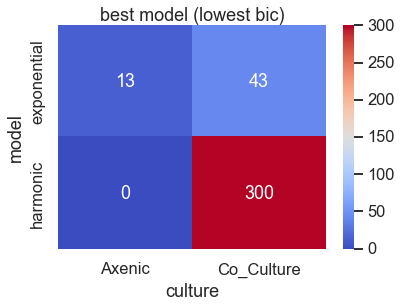

In [25]:
best_model_df = dfscorem.loc[dfscorem.model.isin(['bic_exponential', 'bic_harmonic'])
                            ].sort_values('RMSE', ascending=True).drop_duplicates([
    'experiment_sample', ])
t = best_model_df.loc[best_model_df.culture.isin(['Axenic', 'Co_Culture'])].pivot_table(index=['culture'],columns=['model'], values='sample', aggfunc='count')
t.rename(columns={'bic_exponential': 'exponential', 'bic_harmonic': 'harmonic'}, inplace=True)
t.fillna(0, inplace=True)
for i in t.columns:
    t[i] = t[i].astype(int)
sns.set_context('talk')
sns.heatmap(t.T, annot=True, cmap='coolwarm', fmt='d')
plt.title('best model (lowest bic)')

Text(0.5,1,'best model fit')

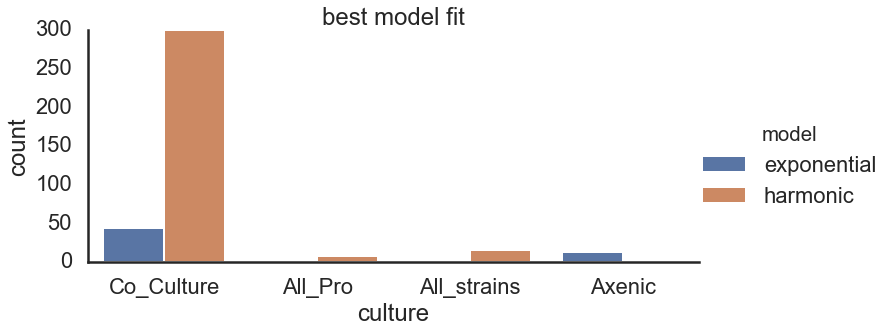

In [26]:
sns.set_context('poster')
best_model_df = dfscorem.loc[dfscorem.model.isin(['bic_exponential', 'bic_harmonic'])
                            ].sort_values('RMSE', ascending=True).drop_duplicates([
    'experiment_sample', ])
best_model_df.model = best_model_df.model.map({'bic_exponential': 'exponential', 'bic_harmonic': 'harmonic'})
sns.catplot(data=best_model_df, x='culture', hue='model', kind='count', aspect=2, 
            hue_order=['exponential', 'harmonic'])
plt.title("best model fit")

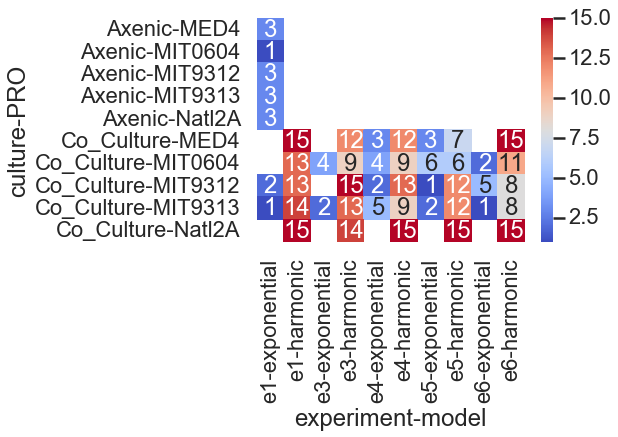

In [27]:
t = best_model_df.loc[best_model_df.culture.isin(['Axenic', 'Co_Culture'])].pivot_table(index=['culture',  'PRO', ],columns=['experiment', 'model', ], values='sample', aggfunc='count')
#sns.set_context('talk')
sns.heatmap(t, annot=True, cmap='coolwarm')


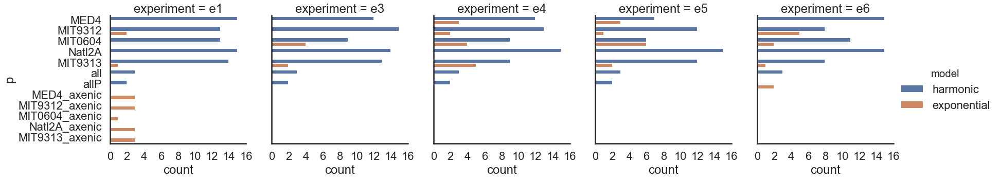

In [28]:
best_model_df['p'] = best_model_df['PRO']
best_model_df.loc[best_model_df.culture == 'Axenic','p'] = best_model_df.loc[best_model_df.culture == 'Axenic','p'] + '_axenic'
sns.catplot(data=best_model_df, y='p', hue='model', kind='count', col='experiment',
           order=['MED4', 'MIT9312', 'MIT0604', 'Natl2A', 'MIT9313', 'all', 'allP',
                     'MED4_axenic', 'MIT9312_axenic', 'MIT0604_axenic', 'Natl2A_axenic', 'MIT9313_axenic'
                     ],
            col_order=eorder,
           )


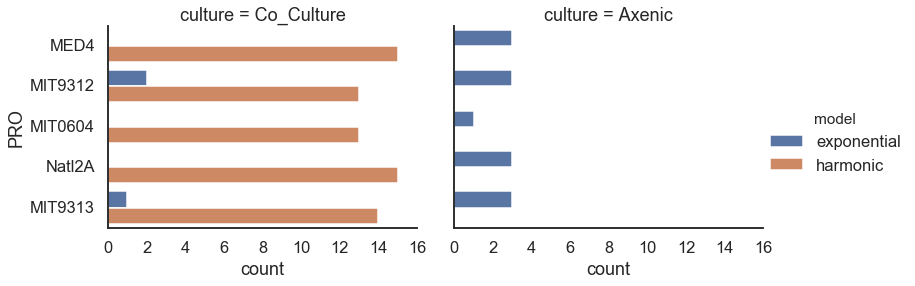

In [29]:
sns.set_context('talk')
#best_model_df['p'] = best_model_df['PRO']
#best_model_df.loc[best_model_df.culture == 'Axenic','p'] = best_model_df.loc[best_model_df.culture == 'Axenic','p'] + '_axenic'
sns.catplot(data=best_model_df.loc[(best_model_df.experiment == 'e1') & 
                                   (best_model_df.culture.isin(['Co_Culture', 'Axenic']))],
            y='PRO', hue='model', kind='count', col='culture',
           order=porder,
            col_order=['Co_Culture', 'Axenic'],
            aspect=1.4, height=4
            #col_order=eorder,
           )


In [30]:
best_model_df.p.unique()

array(['MIT9313', 'MED4', 'MIT9312', 'Natl2A', 'allP', 'MIT0604', 'all',
       'MIT9313_axenic', 'MED4_axenic', 'MIT9312_axenic', 'Natl2A_axenic',
       'MIT0604_axenic'], dtype=object)

In [31]:
porder

['MED4', 'MIT9312', 'MIT0604', 'Natl2A', 'MIT9313']

In [32]:
best_model_df.head()

,experiment_sample,experiment,sample,PRO,ALT,culture,model,RMSE,s,e,p
2999,"e6, 17A",e6,17A,MIT9313,BS11,Co_Culture,harmonic,558.624520,"17A, BS11","e6, Co_Culture",MIT9313
2533,"e5, 11C",e5,11C,MED4,DE1,Co_Culture,exponential,617.270983,"11C, DE1","e5, Co_Culture",MED4
2936,"e5, 1C",e5,1C,MED4,1A3,Co_Culture,harmonic,638.062615,"1C, 1A3","e5, Co_Culture",MED4
3041,"e6, 7C",e6,7C,MIT9313,DE,Co_Culture,harmonic,699.277346,"7C, DE","e6, Co_Culture",MIT9313
3040,"e6, 7A",e6,7A,MIT9313,DE,Co_Culture,harmonic,700.611403,"7A, DE","e6, Co_Culture",MIT9313


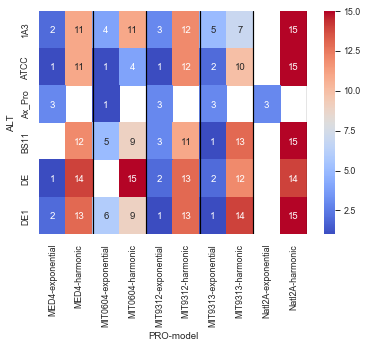

In [33]:

t = best_model_df.loc[best_model_df.culture.isin(['Axenic', 'Co_Culture'])
                     ].pivot_table(index=['ALT'], columns=['PRO','model', ], values='sample', aggfunc='count')
sns.set_context('paper')
sns.heatmap(t, annot=True, cmap='coolwarm' )
for i in [2,4,6,8,10]:
    plt.axvline(i, color='black',)


In [34]:
best_model_df['model'].value_counts()


harmonic       323
exponential     58
Name: model, dtype: int64

In [35]:
best_model_df.head()


,experiment_sample,experiment,sample,PRO,ALT,culture,model,RMSE,s,e,p
2999,"e6, 17A",e6,17A,MIT9313,BS11,Co_Culture,harmonic,558.624520,"17A, BS11","e6, Co_Culture",MIT9313
2533,"e5, 11C",e5,11C,MED4,DE1,Co_Culture,exponential,617.270983,"11C, DE1","e5, Co_Culture",MED4
2936,"e5, 1C",e5,1C,MED4,1A3,Co_Culture,harmonic,638.062615,"1C, 1A3","e5, Co_Culture",MED4
3041,"e6, 7C",e6,7C,MIT9313,DE,Co_Culture,harmonic,699.277346,"7C, DE","e6, Co_Culture",MIT9313
3040,"e6, 7A",e6,7A,MIT9313,DE,Co_Culture,harmonic,700.611403,"7A, DE","e6, Co_Culture",MIT9313


In [36]:
dfscore.describe()

,exponential_popt_0,exponential_popt_1,exponential_popt_2,rmse_exponential,rmse_exponential_60,rmse_exponential_5,bic_exponential,harmonic_popt_0,harmonic_popt_1,harmonic_popt_2,rmse_harmonic,rmse_harmonic_60,rmse_harmonic_5,bic_harmonic
count,381.000000,381.000000,381.000000,3.810000e+02,3.730000e+02,3.810000e+02,381.000000,381.000000,381.000000,381.000000,3.810000e+02,3.730000e+02,3.810000e+02,381.000000
mean,0.131212,0.874016,0.874016,1.015392e+07,6.079034e+06,1.473923e+07,1939.299199,0.303213,0.940945,0.940945,7.282748e+06,3.764113e+06,1.574353e+07,1899.783714
std,0.103388,0.217357,0.217357,8.118216e+06,5.827432e+06,1.600178e+07,573.973314,0.256671,0.161581,0.161581,5.909428e+06,3.651598e+06,1.826935e+07,566.827864
min,0.019532,0.500000,0.500000,1.037347e+06,5.906411e+05,2.236477e-01,560.078566,0.040657,0.500000,0.500000,9.386067e+05,9.412526e+04,5.106361e+00,558.624520
25%,0.061422,0.500000,0.500000,4.939066e+06,2.043542e+06,4.480142e+06,1370.446354,0.156349,1.000000,1.000000,3.576870e+06,1.159904e+06,5.341528e+06,1303.765841
50%,0.103469,1.000000,1.000000,8.531579e+06,4.229367e+06,1.061856e+07,2135.874945,0.238789,1.000000,1.000000,6.212255e+06,2.625764e+06,1.018897e+07,2074.678407
75%,0.176936,1.000000,1.000000,1.277917e+07,8.051288e+06,1.936247e+07,2337.122434,0.367718,1.000000,1.000000,8.615585e+06,5.167226e+06,1.852176e+07,2281.281539
max,1.042529,1.000000,1.000000,6.502485e+07,3.707134e+07,1.445927e+08,2884.765740,1.843591,1.000000,1.000000,4.460828e+07,2.496297e+07,1.169666e+08,2836.202047


In [37]:
sns.set_context('poster')

In [38]:
dfscore.columns

Index(['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT', 'culture',
       'exponential_popt_0', 'exponential_popt_1', 'exponential_popt_2',
       'rmse_exponential', 'rmse_exponential_60', 'rmse_exponential_5',
       'bic_exponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'rmse_harmonic_60',
       'rmse_harmonic_5', 'bic_harmonic'],
      dtype='object')

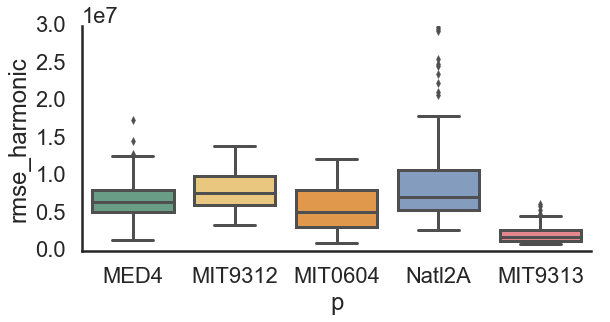

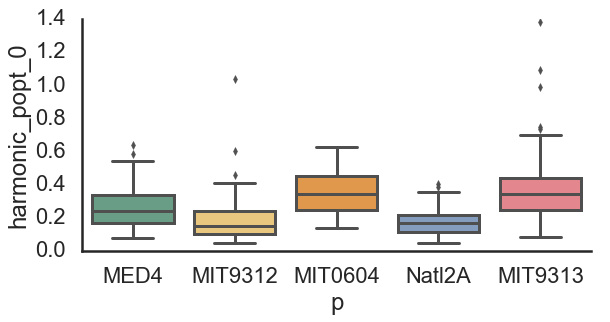

In [39]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture=='Axenic','p'] = dfscore.loc[dfscore.culture=='Axenic','p'] + '_Axenic'

for i in ['rmse_harmonic', 'harmonic_popt_0', ]:
    sns.catplot(data=dfscore.loc[dfscore.culture =='Co_Culture'], 
                x='p', y=i, kind='box',
           order=porder, palette=ppallete,
           aspect=1.8)


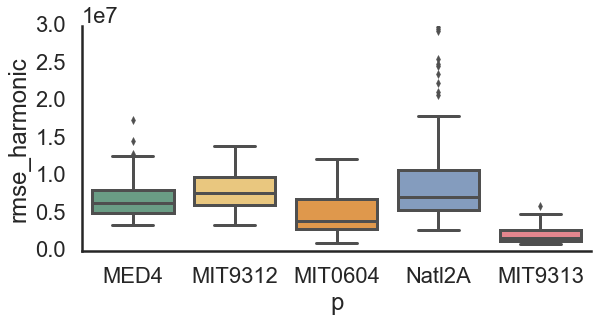

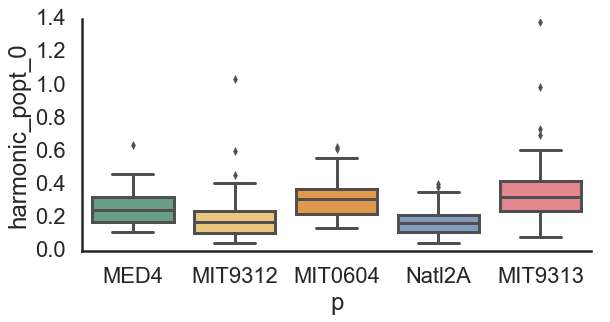

In [40]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture=='Axenic','p'] = dfscore.loc[dfscore.culture=='Axenic','p'] + '_Axenic'

for i in ['rmse_harmonic', 'harmonic_popt_0',  ]:
    sns.catplot(data=dfscore.loc[#(dfscore.culture =='Co_Culture') &
                                dfscore.experiment_sample.isin(
                                    best_model_df.loc[best_model_df.model == 'harmonic', 'experiment_sample'])
                                ], 
                x='p', y=i, kind='box',
           order=porder, palette=ppallete,
           aspect=1.8)
    



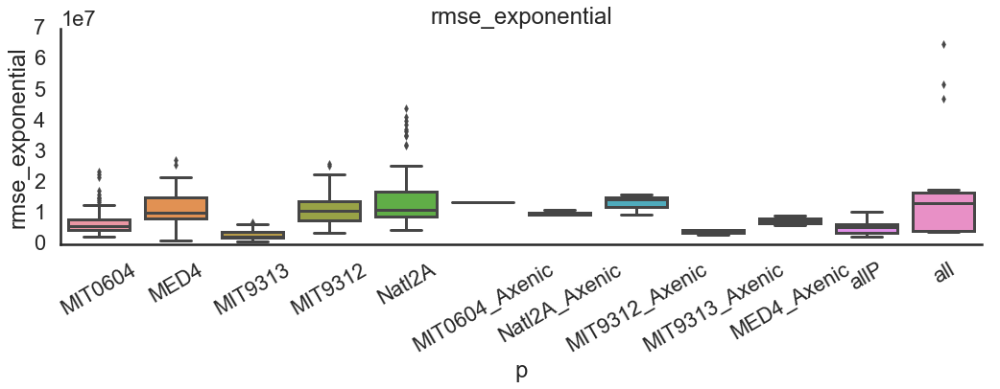

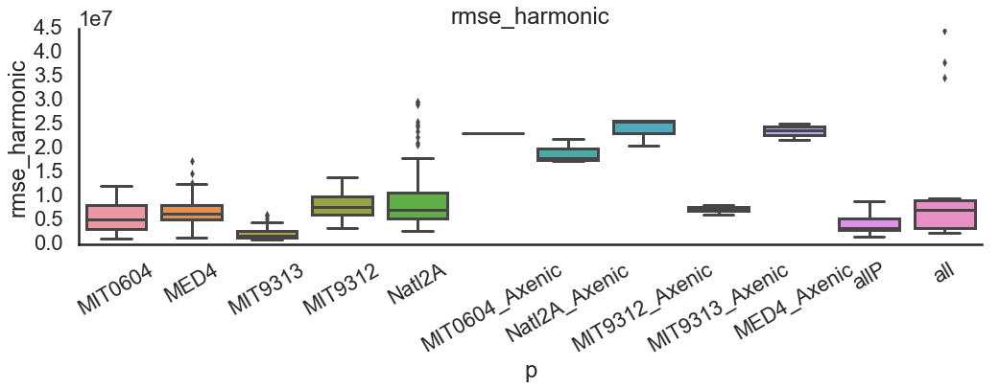

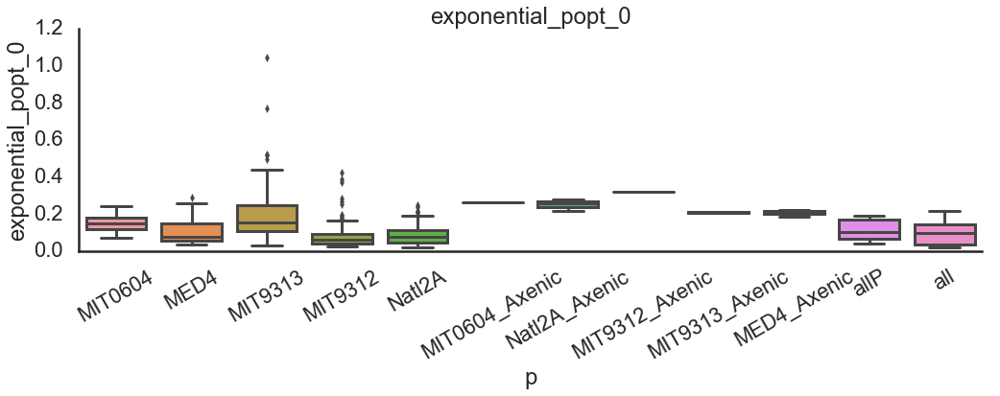

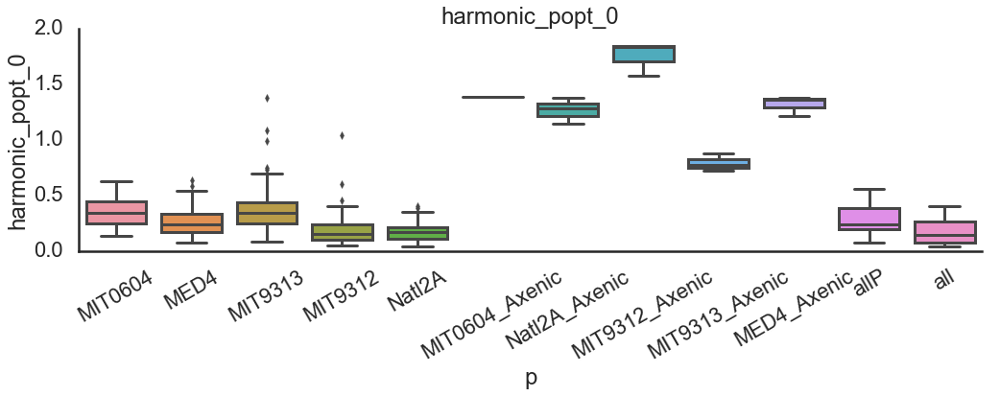

In [41]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] = dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] + '_Axenic'

for i in ['rmse_exponential','rmse_harmonic', 'exponential_popt_0',  'harmonic_popt_0']:
    sns.catplot(data=dfscore, 
                x='p', y=i, kind='box',
           #order=porder, palette=ppallete,
           aspect=3)
    #plt.yscale('log')
    plt.xticks(rotation=30)
    plt.title(i)


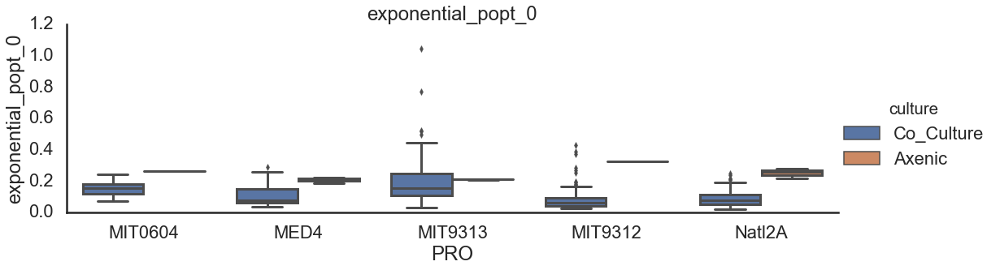

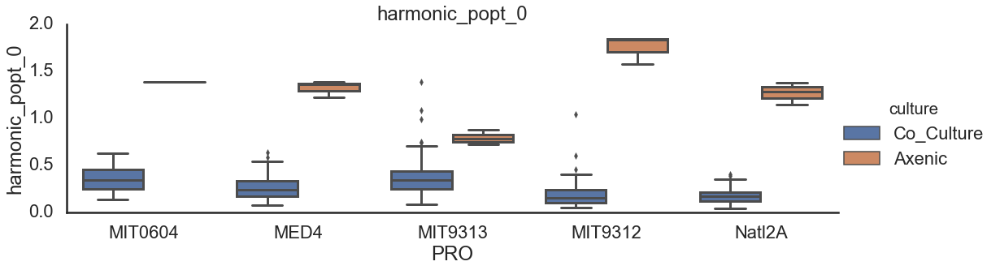

In [42]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] = dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] + '_Axenic'

for i in ['exponential_popt_0',  'harmonic_popt_0']:
    sns.catplot(data=dfscore.loc[dfscore.culture.isin(['Co_Culture', 'Axenic'])], 
                x='PRO', y=i, kind='box',
                hue='culture',
           #order=porder, palette=ppallete,
           aspect=3)
    #plt.yscale('log')
    #plt.xticks(rotation=30)
    plt.title(i)


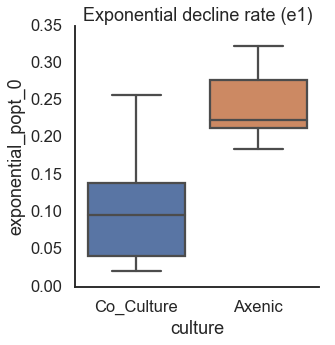

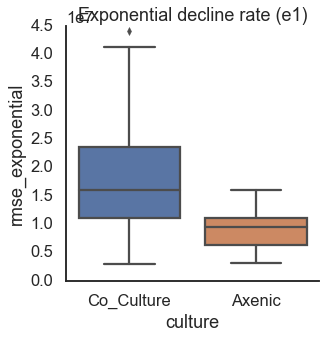

In [115]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] = dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] + '_Axenic'

for i in ['exponential_popt_0', 'rmse_exponential', #'harmonic_popt_0'
         ]:
    sns.catplot(data=dfscore.loc[dfscore.culture.isin(['Co_Culture', 'Axenic']) & 
                                 dfscore.experiment.isin(['e1'])], 
                #x='PRO', 
                y=i, kind='box',
                x='culture',
                           #order=porder, #palette=ppallete,
           #aspect=3
               )
    #plt.yscale('log')
    #plt.xticks(rotation=30)
    plt.title('Exponential decline rate (e1)')


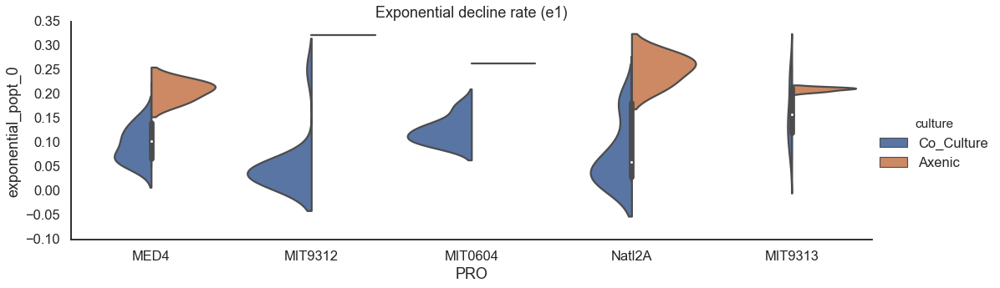

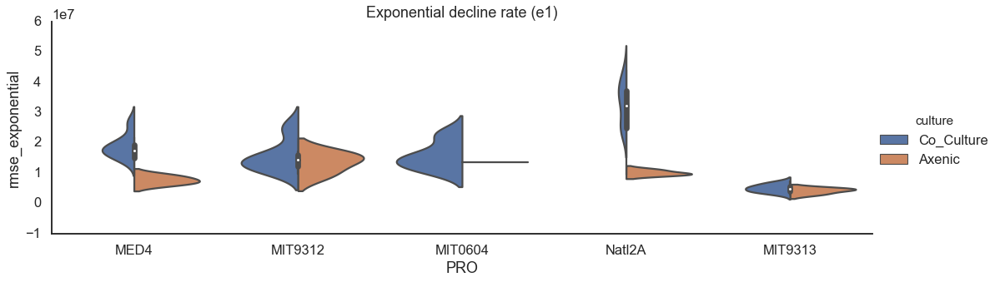

In [108]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] = dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] + '_Axenic'

for i in ['exponential_popt_0', 'rmse_exponential', #'harmonic_popt_0'
         ]:
    sns.catplot(data=dfscore.loc[dfscore.culture.isin(['Co_Culture', 'Axenic']) & 
                                 dfscore.experiment.isin(['e1'])], 
                x='PRO', 
                y=i, kind='violin',
                hue='culture',
                split=True,
           order=porder, #palette=ppallete,
           aspect=3
               )
    #plt.yscale('log')
    #plt.xticks(rotation=30)
    #plt.title(i)
    plt.title('Exponential decline rate (e1)')


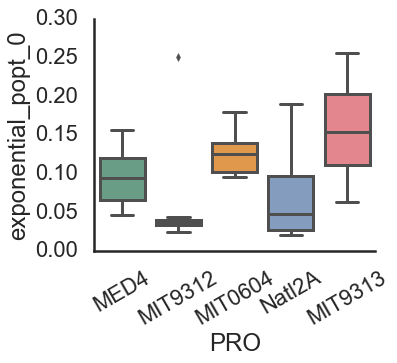

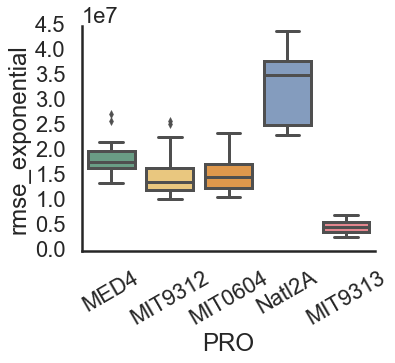

In [65]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] = dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] + '_Axenic'

for i in ['exponential_popt_0', 'rmse_exponential', #'harmonic_popt_0'
         ]:
    sns.catplot(data=dfscore.loc[dfscore.culture.isin(['Co_Culture', ]) & 
                                 dfscore.experiment.isin(['e1'])], 
                x='PRO', 
                y=i, kind='box',
                #col='culture',
           order=porder, palette=ppallete,
           aspect=1.2
               )
    #plt.yscale('log')
    plt.xticks(rotation=30)
    #plt.title(i)


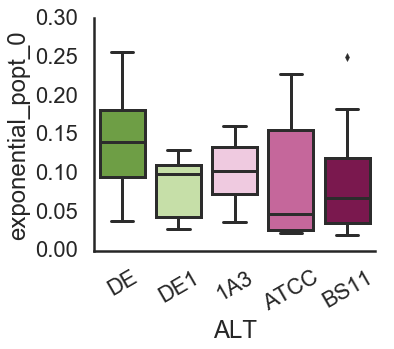

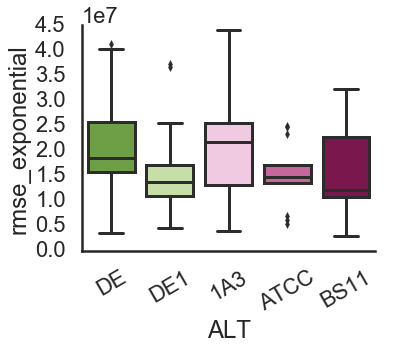

In [72]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] = dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] + '_Axenic'

for i in ['exponential_popt_0', 'rmse_exponential', #'harmonic_popt_0'
         ]:
    sns.catplot(data=dfscore.loc[dfscore.culture.isin(['Co_Culture', ]) & 
                                 dfscore.experiment.isin(['e1'])], 
                x='ALT', 
                y=i, kind='box',
                #col='culture',
           order=aorder, palette=apallete,
           aspect=1.2
               )
    #plt.yscale('log')
    plt.xticks(rotation=30)
    #plt.title(i)


In [61]:
from statsmodels.formula.api import ols
dfdata=dfscore.loc[dfscore.culture.isin(['Co_Culture', ]) & 
                   dfscore.experiment.isin(['e1'])]

mod = ols('exponential_popt_0 ~ C(PRO)',
                data=dfdata).fit()
#print (f'++++++++++++++++++ day = {d} +++++++++++++++++++++++')
print(mod.summary())
print(sm.stats.anova_lm(mod))
print(f'exponential_popt_0 as function of PRO strain')
pair_t = mod.t_test_pairwise("C(PRO)", method='b')
print(pair_t.result_frame)
print(f'exponential_popt_0 as function of PRO strain')
print(pair_t.result_frame.loc[pair_t.result_frame['reject-b'], 'pvalue-b'])
#aov_table = sm.stats.anova_lm(mod, typ=2)
#print(aov_table)

                            OLS Regression Results                            
Dep. Variable:     exponential_popt_0   R-squared:                       0.378
Model:                            OLS   Adj. R-squared:                  0.342
Method:                 Least Squares   F-statistic:                     10.33
Date:                Wed, 18 Mar 2020   Prob (F-statistic):           1.34e-06
Time:                        12:30:14   Log-Likelihood:                 117.42
No. Observations:                  73   AIC:                            -224.8
Df Residuals:                      68   BIC:                            -213.4
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.0947      0.01

In [68]:
from statsmodels.formula.api import ols
dfdata=dfscore.loc[dfscore.culture.isin(['Co_Culture', ]) & 
                   dfscore.experiment.isin(['e1'])]

mod = ols('exponential_popt_0 ~ C(ALT)',
                data=dfdata).fit()
#print (f'++++++++++++++++++ day = {d} +++++++++++++++++++++++')
print(mod.summary())
print(sm.stats.anova_lm(mod))
print(f'exponential_popt_0 as function of ALT strain')
pair_t = mod.t_test_pairwise("C(ALT)", method='b')
print(pair_t.result_frame)
print(f'exponential_popt_0 as function of ALT strain')
print(pair_t.result_frame.loc[pair_t.result_frame['reject-b'], 'pvalue-b'])
#aov_table = sm.stats.anova_lm(mod, typ=2)
#print(aov_table)

                            OLS Regression Results                            
Dep. Variable:     exponential_popt_0   R-squared:                       0.117
Model:                            OLS   Adj. R-squared:                  0.065
Method:                 Least Squares   F-statistic:                     2.252
Date:                Wed, 18 Mar 2020   Prob (F-statistic):             0.0724
Time:                        13:54:08   Log-Likelihood:                 104.62
No. Observations:                  73   AIC:                            -199.2
Df Residuals:                      68   BIC:                            -187.8
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          0.1007      0.015      6.

In [69]:
from statsmodels.formula.api import ols
dfdata=dfscore.loc[dfscore.culture.isin(['Co_Culture', ]) & 
                   dfscore.experiment.isin(['e1'])]

mod = ols('rmse_exponential ~ C(PRO)',
                data=dfdata).fit()
#print (f'++++++++++++++++++ day = {d} +++++++++++++++++++++++')
print(mod.summary())
print(sm.stats.anova_lm(mod))
print(f'exponential_popt_0 as function of PRO strain')
pair_t = mod.t_test_pairwise("C(PRO)", method='b')
print(pair_t.result_frame)
print(f'exponential_popt_0 as function of PRO strain')
print(pair_t.result_frame.loc[pair_t.result_frame['reject-b'], 'pvalue-b'])
#aov_table = sm.stats.anova_lm(mod, typ=2)
#print(aov_table)

                            OLS Regression Results                            
Dep. Variable:       rmse_exponential   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.792
Method:                 Least Squares   F-statistic:                     69.33
Date:                Wed, 18 Mar 2020   Prob (F-statistic):           2.87e-23
Time:                        13:54:28   Log-Likelihood:                -1222.4
No. Observations:                  73   AIC:                             2455.
Df Residuals:                      68   BIC:                             2466.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept          1.879e+07   1.21e+0

In [70]:
from statsmodels.formula.api import ols
dfdata=dfscore.loc[dfscore.culture.isin(['Co_Culture', ]) & 
                   dfscore.experiment.isin(['e1'])]

mod = ols('rmse_exponential ~ C(ALT)',
                data=dfdata).fit()
#print (f'++++++++++++++++++ day = {d} +++++++++++++++++++++++')
print(mod.summary())
print(sm.stats.anova_lm(mod))
print(f'exponential_popt_0 as function of ALT strain')
pair_t = mod.t_test_pairwise("C(ALT)", method='b')
print(pair_t.result_frame)
print(f'exponential_popt_0 as function of ALT strain')
print(pair_t.result_frame.loc[pair_t.result_frame['reject-b'], 'pvalue-b'])
#aov_table = sm.stats.anova_lm(mod, typ=2)
#print(aov_table)

                            OLS Regression Results                            
Dep. Variable:       rmse_exponential   R-squared:                       0.060
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     1.088
Date:                Wed, 18 Mar 2020   Prob (F-statistic):              0.369
Time:                        13:54:52   Log-Likelihood:                -1279.4
No. Observations:                  73   AIC:                             2569.
Df Residuals:                      68   BIC:                             2580.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       2.049e+07   2.65e+06      7.

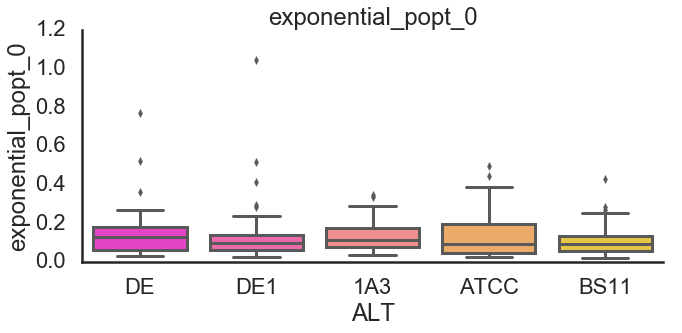

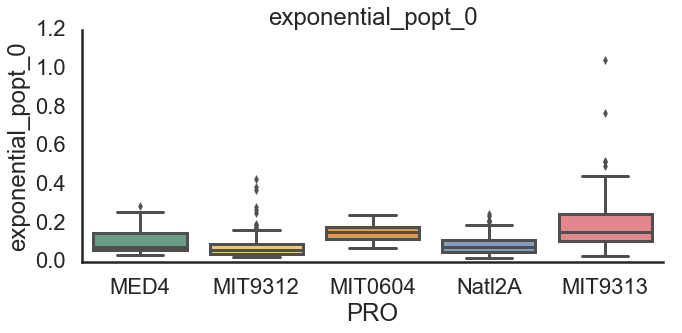

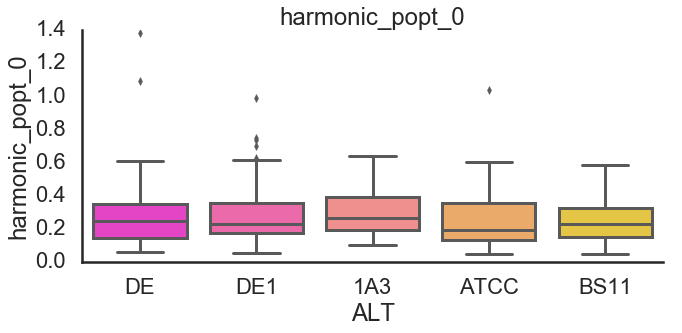

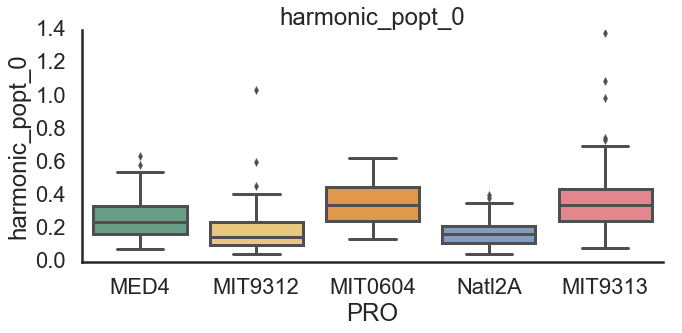

In [44]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] = dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] + '_Axenic'

for i in ['exponential_popt_0',  'harmonic_popt_0']:
    sns.catplot(data=dfscore.loc[dfscore.culture.isin(['Co_Culture'])], 
                x='ALT', y=i, kind='box',
                #hue='culture',
           order=aorder, palette=apallete,
                aspect=2,
           )
    plt.title(i)

    sns.catplot(data=dfscore.loc[dfscore.culture.isin(['Co_Culture'])], 
                x='PRO', y=i, kind='box',
                #hue='culture',
           order=porder, palette=ppallete,
                aspect=2,
           )
    plt.title(i)
    

(0, 0.6)

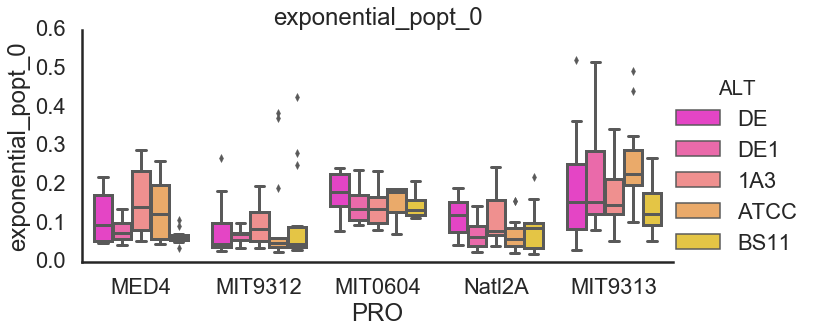

In [45]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] = dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] + '_Axenic'

for i in ['exponential_popt_0']:
    sns.catplot(data=dfscore.loc[dfscore.culture.isin(['Co_Culture'])], 
                x='PRO', y=i, kind='box', hue='ALT',
                #hue='culture',
           hue_order=aorder, palette=apallete,
                order=porder,
                aspect=2,
           )
    plt.title(i)
plt.ylim(0,0.6)

In [75]:
dfdecline

,experiment_sample,day,FL,experiment,sample,PRO,ALT,culture,FL_o,exponential,exponential_popt_0,exponential_popt_1,exponential_popt_2,harmonic,harmonic_popt_0,harmonic_popt_1,harmonic_popt_2
0,"e1, 10A",0.000000,1.947185e+08,e1,10A,MIT0604,DE,Co_Culture,5.621,1.947185e+08,0.139137,1.0,1.0,1.947185e+08,0.277270,1.0,1.0
1,"e1, 10A",0.893056,1.401239e+08,e1,10A,MIT0604,DE,Co_Culture,4.045,1.719662e+08,0.139137,1.0,1.0,1.560722e+08,0.277270,1.0,1.0
2,"e1, 10A",1.991667,9.522880e+07,e1,10A,MIT0604,DE,Co_Culture,2.749,1.475903e+08,0.139137,1.0,1.0,1.254443e+08,0.277270,1.0,1.0
3,"e1, 10A",4.697222,1.012910e+08,e1,10A,MIT0604,DE,Co_Culture,2.924,1.012910e+08,0.139137,1.0,1.0,8.457194e+07,0.277270,1.0,1.0
4,"e1, 10A",5.700000,8.726131e+07,e1,10A,MIT0604,DE,Co_Culture,2.519,8.810015e+07,0.139137,1.0,1.0,7.545938e+07,0.277270,1.0,1.0
5,"e1, 10A",6.882639,4.049562e+07,e1,10A,MIT0604,DE,Co_Culture,1.169,7.473328e+07,0.139137,1.0,1.0,6.695149e+07,0.277270,1.0,1.0
6,"e1, 10A",7.990972,2.854439e+07,e1,10A,MIT0604,DE,Co_Culture,0.824,6.405329e+07,0.139137,1.0,1.0,6.055320e+07,0.277270,1.0,1.0
7,"e1, 10A",8.663194,2.767836e+07,e1,10A,MIT0604,DE,Co_Culture,0.799,5.833396e+07,0.139137,1.0,1.0,5.723568e+07,0.277270,1.0,1.0
8,"e1, 10A",11.741667,2.764372e+07,e1,10A,MIT0604,DE,Co_Culture,0.798,3.801023e+07,0.139137,1.0,1.0,4.575565e+07,0.277270,1.0,1.0
9,"e1, 10A",12.711806,3.422555e+07,e1,10A,MIT0604,DE,Co_Culture,0.988,3.321073e+07,0.139137,1.0,1.0,4.303545e+07,0.277270,1.0,1.0


In [76]:
best_model_df.columns

Index(['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT', 'culture',
       'model', 'RMSE', 's', 'e', 'p'],
      dtype='object')

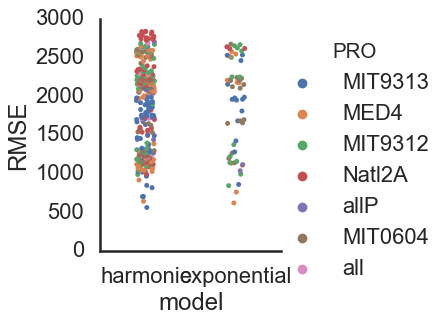

In [77]:
sns.catplot(data=best_model_df, x='model', y='RMSE', hue='PRO')

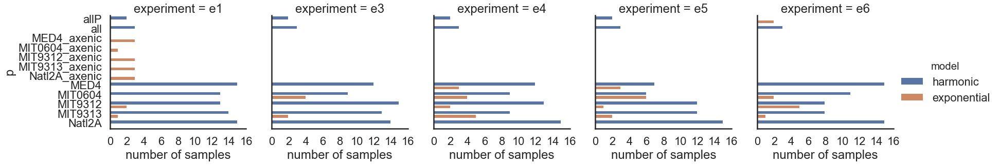

In [78]:
df_best_count = best_model_df.groupby(['culture','p', 'experiment',  'model'])['sample'].count().reset_index()
#df_best_count.model =df_best_count.model.map({'bic_exponential': 'exponential', 'bic_harmonic': 'harmonic'})
df_best_count.rename(columns={'sample': 'number of samples'}, inplace=True)

sns.catplot(data=df_best_count,y='p', hue='model', x='number of samples', #row='culture',
            col='experiment', kind='bar')

In [79]:
value_vars = [ 'FL', 'exponential', #'hyperbolic',
              'harmonic',
             ]
id_vars = ['experiment_sample', 'day',  'experiment', 'sample', 'PRO', 'ALT',
       'culture', ]      
dfresm = dfdecline.melt(value_vars=value_vars, id_vars=id_vars )

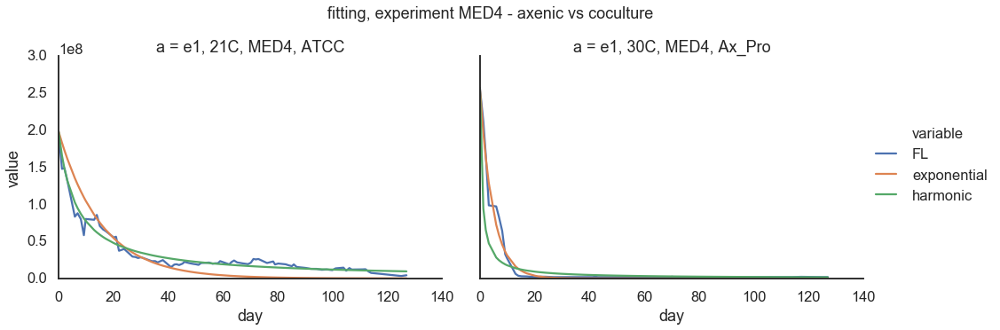

In [80]:
sns.set_context('talk')
dfresm['alt'] = dfresm['sample'] +', '+dfresm['ALT']
dfresm['a'] = dfresm['experiment_sample'] +', '+dfresm['PRO']+', '+dfresm['ALT']

for p in ['Natl2A']:
    for e in ['e1']:
        sns.relplot(data=dfresm.loc[(dfresm.experiment == e) & #(dfresm.PRO == p) &
                                   (dfresm['sample'].isin(['21C', '30C']))], 
                x='day',
                y='value',
                hue='variable',
                col='a',
                #col_wrap=6,
                kind='line',
                    aspect=1.4
               )
        plt.suptitle(f'fitting, experiment MED4 - axenic vs coculture', y=1.05)
        plt.show()

In [82]:
dfresm.ALT.unique()

array(['DE', 'DE1', 'BS11', '1A3', 'ATCC', 'Ax_Pro', 'all_Pro', 'all'],
      dtype=object)

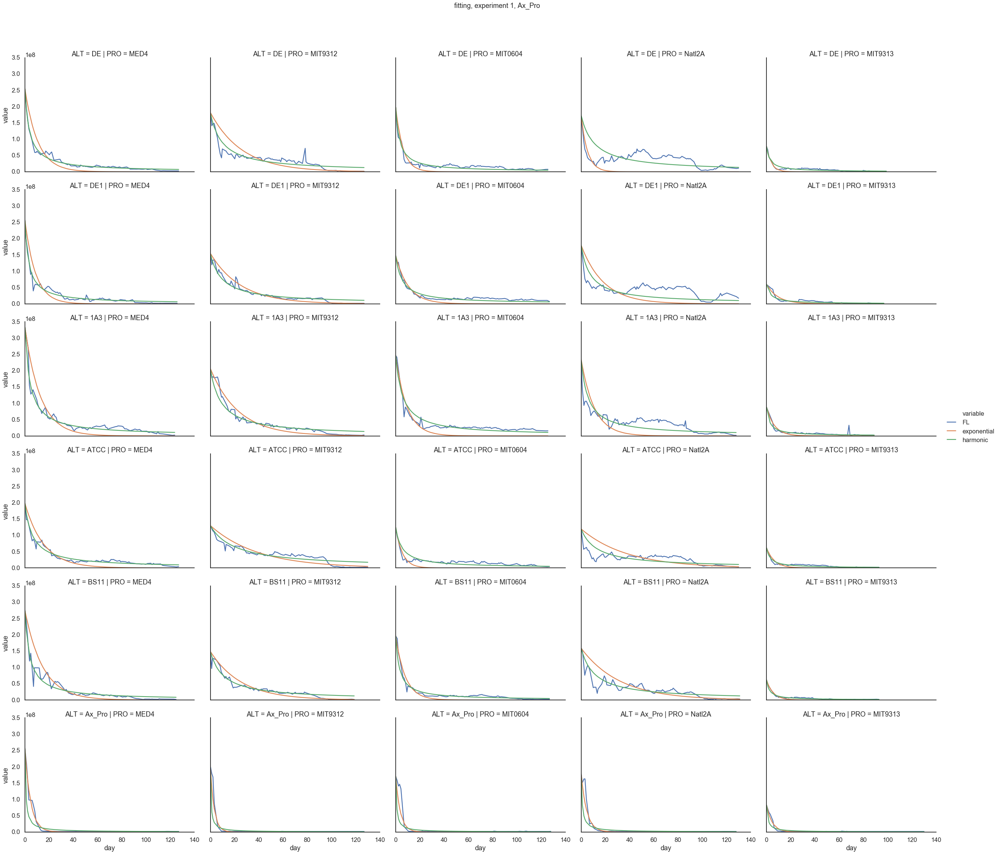

In [94]:
sns.set_context('talk')
dfresm['alt'] = dfresm['sample'] +', '+dfresm['ALT']
dfresm['a'] = dfresm['experiment_sample'] +', '+dfresm['PRO']+', '+dfresm['ALT']

for a in ['Ax_Pro']:
    for e in ['e1']:
        sns.relplot(data=dfresm.loc[(dfresm.experiment == e) & (dfresm.ALT.isin(aorder + ['Ax_Pro'])) &
                                    (dfresm['sample'].str.endswith('C'))
                                   #(dfresm['sample'].isin(['21C', '30C']))
                                   ], 
                x='day',
                y='value',
                hue='variable',
                col='PRO',
                    row='ALT',
                    row_order=aorder+ ['Ax_Pro'],
                    col_order=porder ,
                #col_wrap=5,
                kind='line',
                    aspect=1.4
               )
        plt.suptitle(f'fitting, experiment 1, {a}', y=1.05)
        plt.show()

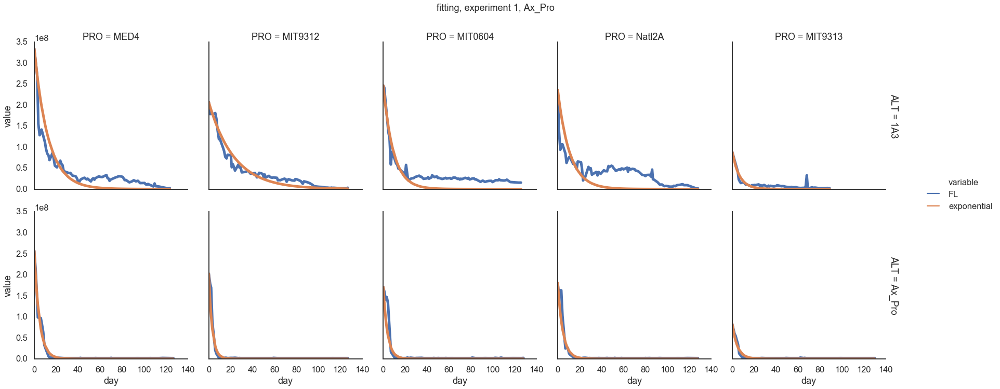

In [104]:
sns.set_context('talk')
dfresm['alt'] = dfresm['sample'] +', '+dfresm['ALT']
dfresm['a'] = dfresm['experiment_sample'] +', '+dfresm['PRO']+', '+dfresm['ALT']

#for a in ['Ax_Pro', '1A3']:
#    for e in ['e1']:
sns.relplot(data=dfresm.loc[(dfresm.experiment == 'e1') & (dfresm.ALT.isin(['1A3', 'Ax_Pro'])) &
                            (dfresm['sample'].str.endswith('C')) &
                            (dfresm['variable'].isin(['FL', 'exponential'])) 
                            
                           #(dfresm['sample'].isin(['21C', '30C']))
                           ], 
        x='day',
        y='value',
        hue='variable',
        col='PRO',
            row='ALT',
            row_order=['1A3','Ax_Pro'],
            col_order=porder ,
        #col_wrap=5,
        kind='line',
            #aspect=1.4
            facet_kws=dict(margin_titles=True),
            linewidth=5,
       )
plt.suptitle(f'fitting, experiment 1, {a}', y=1.05)
plt.show()

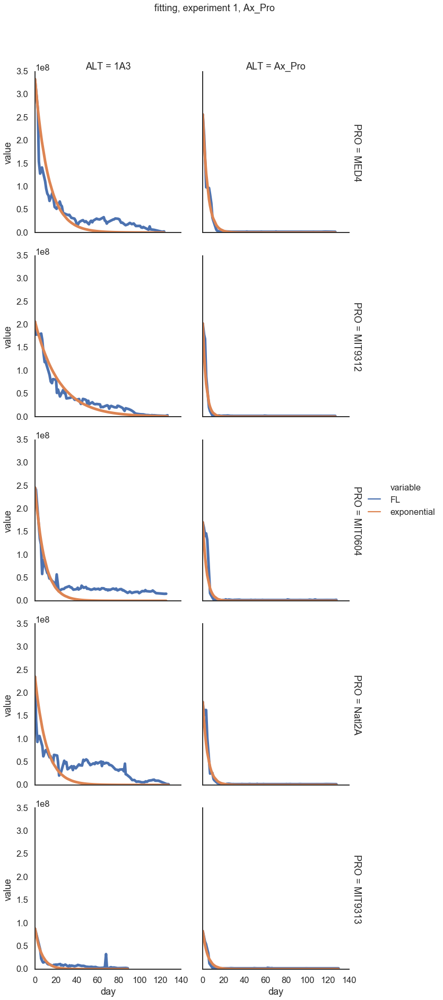

In [105]:
sns.set_context('talk')
dfresm['alt'] = dfresm['sample'] +', '+dfresm['ALT']
dfresm['a'] = dfresm['experiment_sample'] +', '+dfresm['PRO']+', '+dfresm['ALT']

#for a in ['Ax_Pro', '1A3']:
#    for e in ['e1']:
sns.relplot(data=dfresm.loc[(dfresm.experiment == 'e1') & (dfresm.ALT.isin(['1A3', 'Ax_Pro'])) &
                            (dfresm['sample'].str.endswith('C')) &
                            (dfresm['variable'].isin(['FL', 'exponential'])) 
                            
                           #(dfresm['sample'].isin(['21C', '30C']))
                           ], 
        x='day',
        y='value',
        hue='variable',
        row='PRO',
            col='ALT',
            col_order=['1A3','Ax_Pro'],
            row_order=porder ,
        #col_wrap=5,
        kind='line',
            #aspect=1.4
            facet_kws=dict(margin_titles=True),
            linewidth=5,
       )
plt.suptitle(f'fitting, experiment 1, {a}', y=1.05)
plt.show()

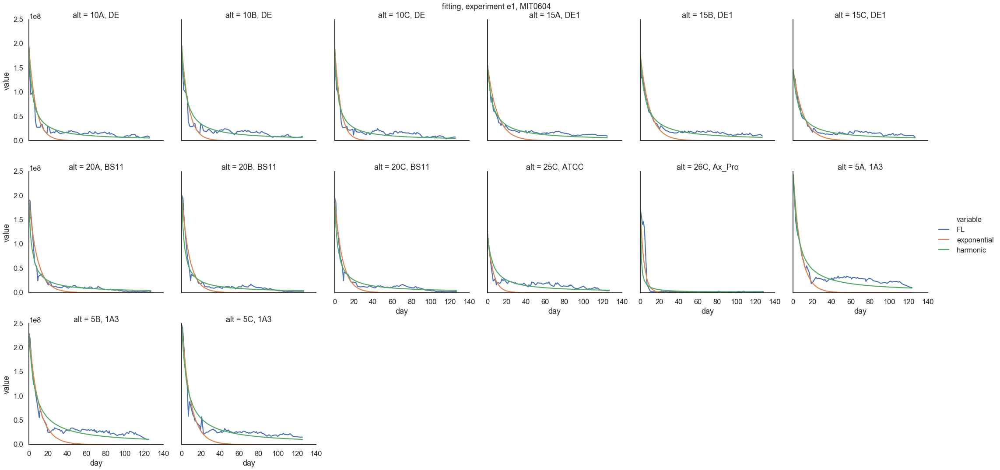

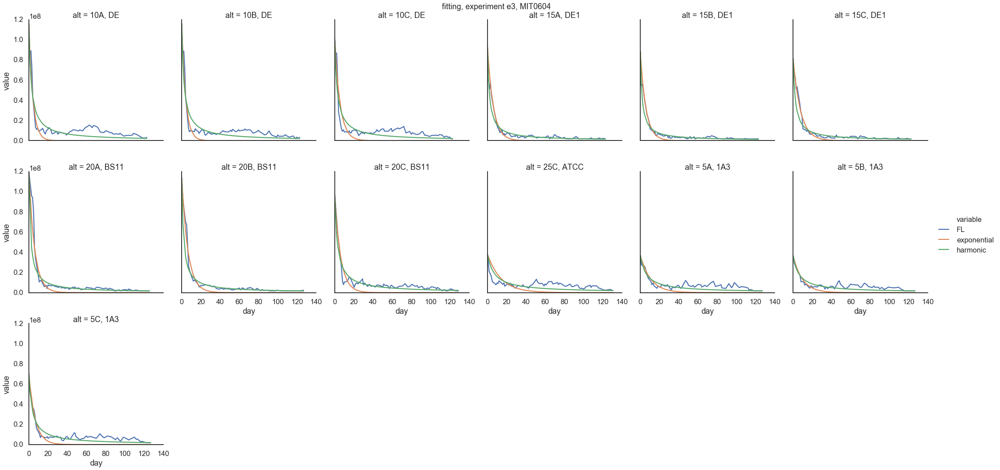

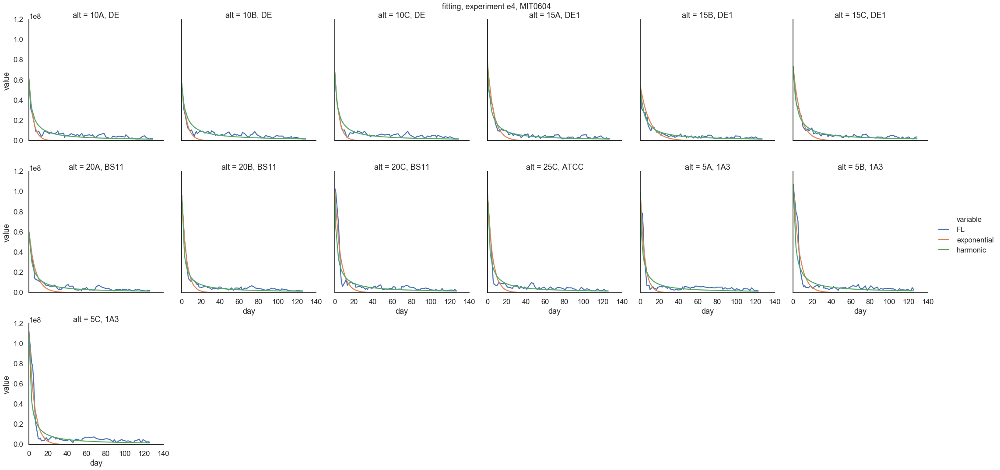

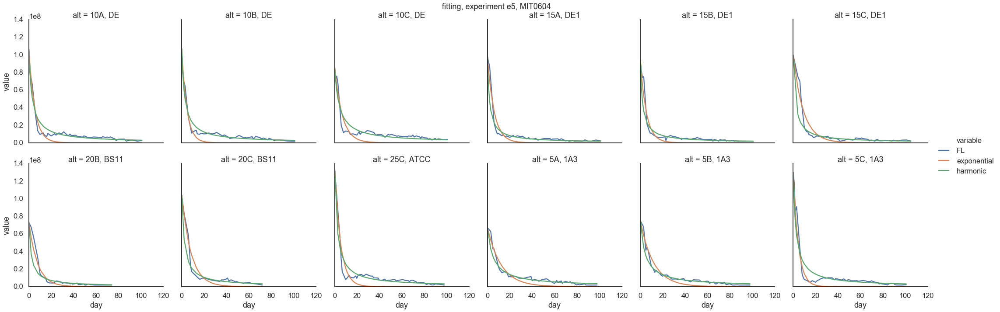

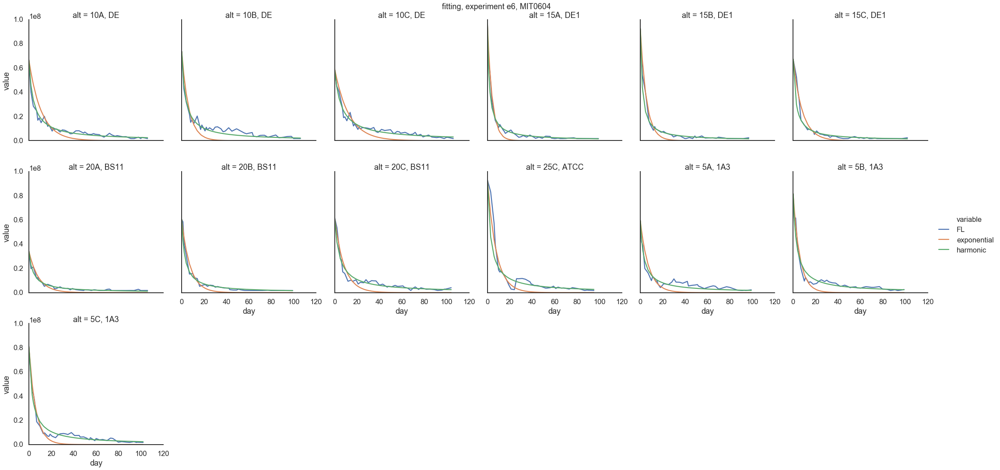

...

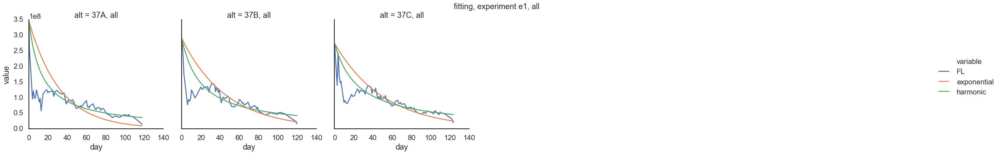

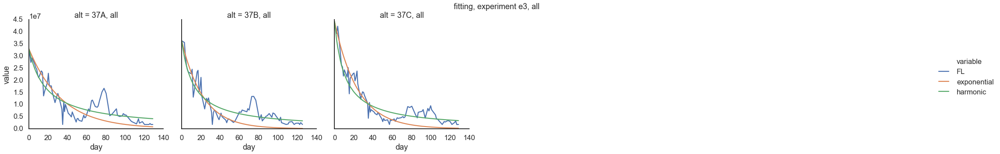

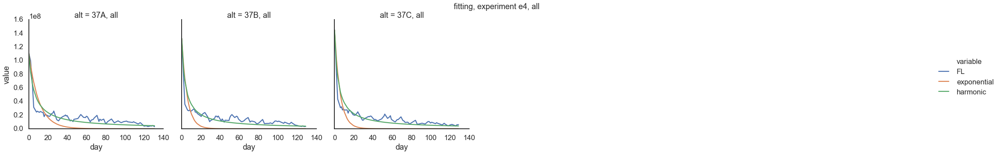

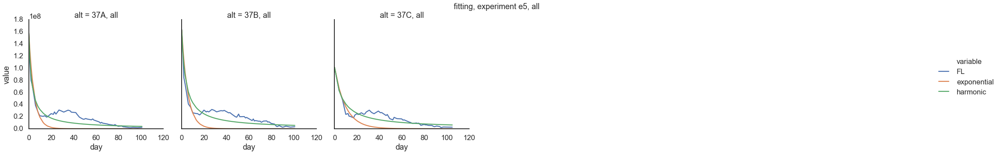

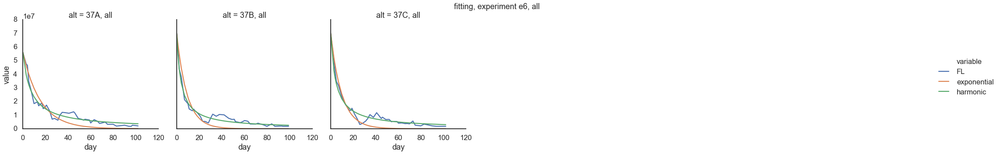

In [81]:
dfresm['alt'] = dfresm['sample'] +', '+dfresm['ALT']
for p in dfresm.PRO.unique():
    for e in dfresm.experiment.unique():
        sns.relplot(data=dfresm.loc[(dfresm.experiment == e) & (dfresm.PRO == p)], 
                x='day',
                y='value',
                hue='variable',
                col='alt',
                col_wrap=6,
                kind='line',
               )
        plt.suptitle(f'fitting, experiment {e}, {p}', y=1)
        plt.show()

In [ ]:
sns.set_context('talk')
dfresm['a'] = dfresm['experiment_sample'] +', '+dfresm['PRO']+', '+dfresm['ALT']
#for p in dfresm.PRO.unique():
#    for e in dfresm.experiment.unique():
exponential_samples = best_model_df.loc[best_model_df.model == 'exponential', 'experiment_sample']
sns.relplot(data=dfresm.loc[dfresm.experiment_sample.isin(exponential_samples) & 
                           (dfresm.experiment == 'e1')
                           ], 
                x='day',
                y='value',
                hue='variable',
                col='a',
                col_wrap=4,
                kind='line',
               )
plt.suptitle(f'exponential fit', y=1)
plt.show()

In [ ]:
sns.set_context('talk')
dfresm['a'] = dfresm['experiment_sample'] +', '+dfresm['PRO']+', '+dfresm['ALT']
#for p in dfresm.PRO.unique():
exponential_samples = best_model_df.loc[(best_model_df.model == 'harmonic') & (best_model_df.experiment == 'e1'),
                                        'experiment_sample']
sns.relplot(data=dfresm.loc[dfresm.experiment_sample.isin(exponential_samples[:16]) & 
                           (dfresm.experiment == 'e1')
                           ], 
                x='day',
                y='value',
                hue='variable',
                col='a',
                col_wrap=4,
                kind='line',
               )
plt.suptitle(f'harmonic fit e1', y=1)
plt.show()

In [ ]:
sns.set_context('talk')
dfresm['a'] = dfresm['experiment_sample'] +', '+dfresm['PRO']+', '+dfresm['ALT']
#for p in dfresm.PRO.unique():
exponential_samples = best_model_df.loc[(best_model_df.model == 'harmonic') & (best_model_df.experiment == 'e1'),
                                        'experiment_sample']
sns.relplot(data=dfresm.loc[dfresm.experiment_sample.isin(exponential_samples[-16:]) & 
                           (dfresm.experiment == 'e1')
                           ], 
                x='day',
                y='value',
                hue='variable',
                col='a',
                col_wrap=4,
                kind='line',
               )
plt.suptitle(f'harmonic fit e1', y=1)
plt.show()

In [ ]:
sns.set_context('talk')
dfresm['a'] = dfresm['experiment_sample'] +', '+dfresm['PRO']+', '+dfresm['ALT']
#for p in dfresm.PRO.unique():
exponential_samples = best_model_df.loc[best_model_df.model == 'harmonic', 'experiment_sample']
for e in dfresm.experiment.unique():
    sns.relplot(data=dfresm.loc[dfresm.experiment_sample.isin(exponential_samples) & 
                               (dfresm.experiment == e)
                               ], 
                    x='day',
                    y='value',
                    hue='variable',
                    col='a',
                    col_wrap=8,
                    kind='line',
                   )
    plt.suptitle(f'harmonic fit {e}', y=1)
    plt.show()

In [ ]:
exponential_samples

In [ ]:
dfresm.columns